In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# import os
import numpy as np
import pandas as pd
import tensorflow as tf

print("TensorFlow:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2025-12-02 18:08:54.200269: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764679134.214370   17434 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764679134.218812   17434 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764679134.230924   17434 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764679134.230942   17434 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764679134.230944   17434 computation_placer.cc:177] computation placer alr

TensorFlow: 2.19.0
Num GPUs Available:  1


In [3]:
PATH = "dataset/"
df = pd.read_csv(PATH + "/train.csv")
pivot_df = df.pivot_table(index='image_path', columns='target_name', values='target').reset_index()

target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
pivot_df = pivot_df[['image_path'] + target_cols]

# train_df, val_df = train_test_split(pivot_df, test_size=0.15, random_state=42)

In [4]:
def normalize(y):
    return tf.math.log1p(y)

def denormalize(y):
    return tf.math.expm1(y)


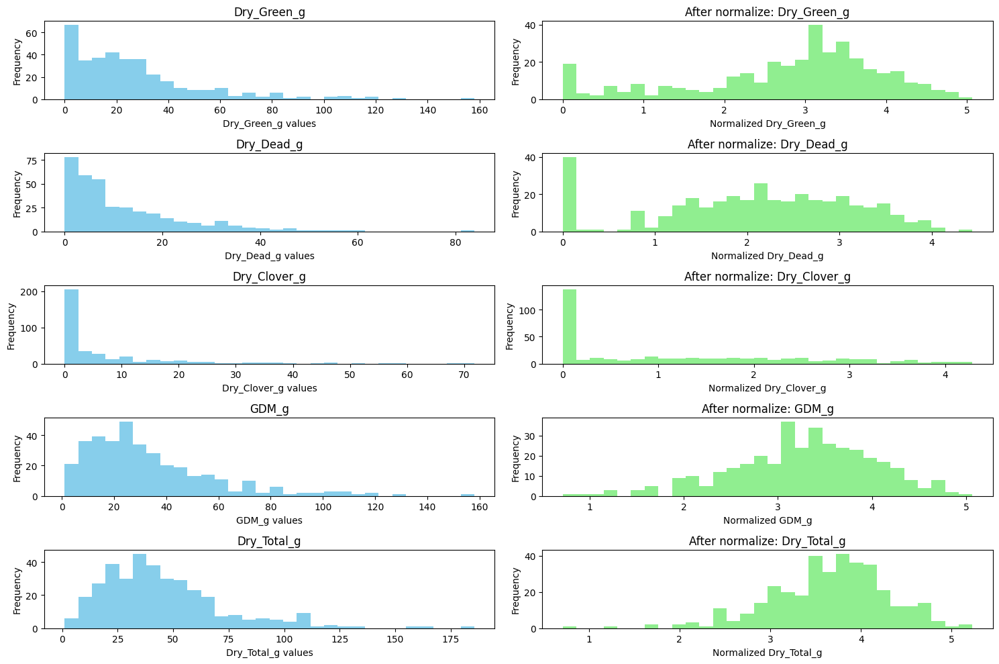

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

x_norm = np.log1p(pivot_df[target_cols])

# Plot histograms for each feature before and after normalization
plt.figure(figsize=(15,10))

for i, col in enumerate(target_cols):
    plt.subplot(5, 2, 2*i + 1)
    plt.hist(pivot_df[col], bins=30, color='skyblue')
    plt.title(f"{col}")
    plt.xlabel(f"{col} values")
    plt.ylabel("Frequency")

    plt.subplot(5, 2, 2*i + 2)
    plt.hist(x_norm[col], bins=30, color='lightgreen')
    plt.title(f"After normalize: {col}")
    plt.xlabel(f"Normalized {col}")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


In [6]:
IMG_SIZE = 768

import tensorflow as tf

# LAB conversion helper
def rgb_to_lab(image):
    # Convert RGB to XYZ
    rgb = image

    # sRGB to linear RGB
    mask = tf.cast(rgb > 0.04045, tf.float32)
    linear_rgb = (rgb / 12.92) * (1 - mask) + tf.pow((rgb + 0.055) / 1.055, 2.4) * mask

    # RGB → XYZ matrix
    M = tf.constant([[0.412453, 0.357580, 0.180423],
                     [0.212671, 0.715160, 0.072169],
                     [0.019334, 0.119193, 0.950227]], tf.float32)

    xyz = tf.tensordot(linear_rgb, M, axes=1)

    # Normalize for D65 white point
    xyz_norm = xyz / tf.constant([0.95047, 1.00000, 1.08883])

    # XYZ → LAB
    epsilon = 0.008856
    kappa   = 903.3

    def f(t):
        return tf.where(t > epsilon, tf.pow(t, 1/3), (kappa * t + 16) / 116)

    f_xyz = f(xyz_norm)

    L = 116 * f_xyz[...,1] - 16
    a = 500 * (f_xyz[...,0] - f_xyz[...,1])
    b = 200 * (f_xyz[...,1] - f_xyz[...,2])

    # Normalize LAB to [0,1]
    L = L / 100.0
    a = (a + 128) / 255.0
    b = (b + 128) / 255.0

    lab = tf.stack([L, a, b], axis=-1)
    return lab


def load_image(path):
    # Read and resize
    img = tf.io.read_file(PATH + "/" + path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32) / 255.0      # RGB (3)

    # --- COLOR SPACES ---
    hsv = tf.image.rgb_to_hsv(img)              # HSV (3)
    lab = rgb_to_lab(img)                       # LAB (3)

    # --- VEGETATION INDICES ---
    r, g, b = img[...,0], img[...,1], img[...,2]

    exg = 2*g - r - b
    exg = tf.expand_dims(exg, -1)

    vari = (g - r) / (g + r - b + 1e-6)
    vari = tf.expand_dims(vari, -1)

    # ---- STACK EVERYTHING (11 channels) ----
    out = tf.concat([img, hsv, lab, exg, vari], axis=-1)

    # ---- CLEAN BAD VALUES ----
    out = tf.where(tf.math.is_nan(out), 0.0, out)
    out = tf.where(tf.math.is_inf(out), 0.0, out)

    return out


Plotting: train/ID2037861084.jpg


I0000 00:00:1764679137.340376   17434 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5842 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


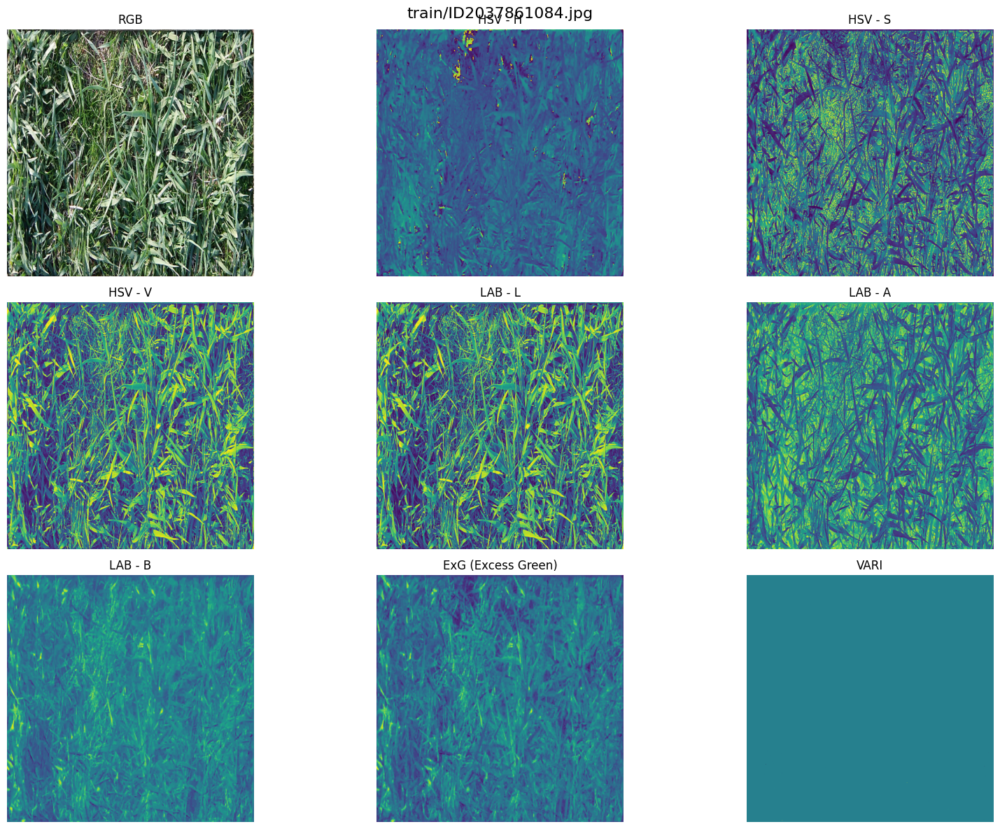

Plotting: train/ID1563418511.jpg


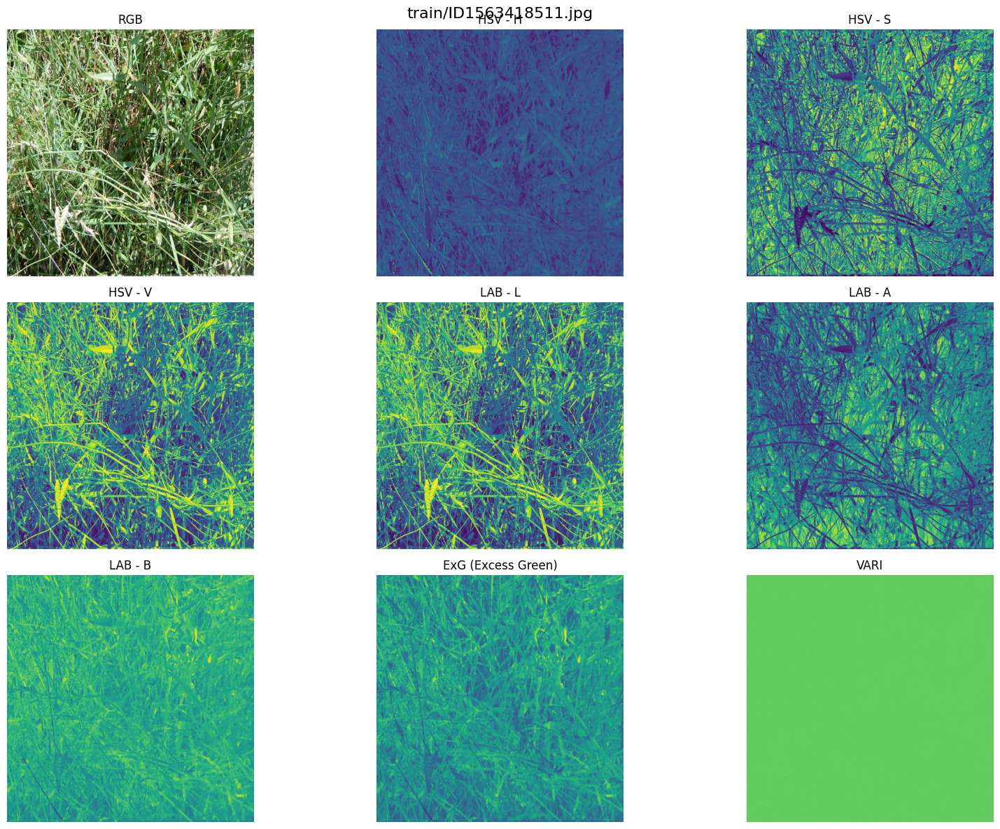

Plotting: train/ID162394992.jpg


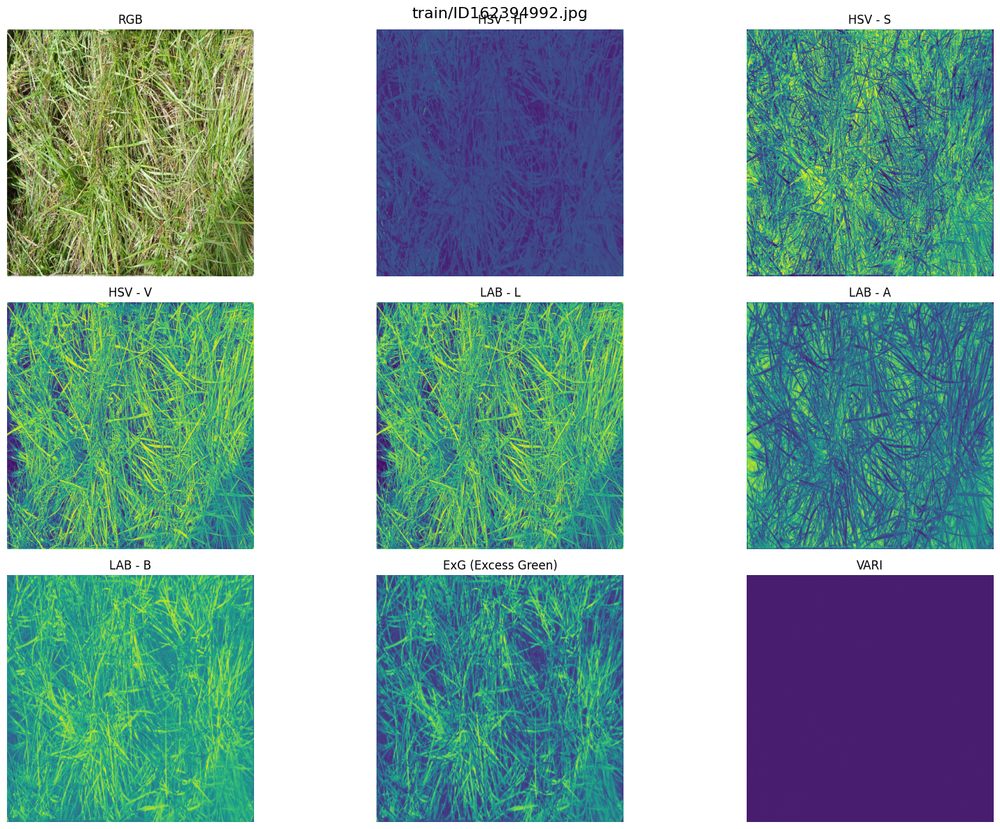

In [7]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

N_SAMPLES = 3  # choose how many images to preview
sample_paths = pivot_df['image_path'].sample(N_SAMPLES).tolist()


def plot_features(img_tensor, title=""):
    """
    img_tensor: output of load_image() → shape (H, W, 11)
    """

    img = img_tensor.numpy()

    # Extract channels (matching load_image)
    RGB  = img[..., :3]

    HSV  = img[..., 3:6]
    LAB  = img[..., 6:9]

    EXG  = img[..., 9]
    VARI = img[..., 10]

    # order matters for visual clarity
    feature_maps = [
        ("RGB", RGB),

        ("HSV - H", HSV[...,0]),
        ("HSV - S", HSV[...,1]),
        ("HSV - V", HSV[...,2]),

        ("LAB - L", LAB[...,0]),
        ("LAB - A", LAB[...,1]),
        ("LAB - B", LAB[...,2]),

        ("ExG (Excess Green)", EXG),
        ("VARI", VARI),
    ]

    plt.figure(figsize=(16, 20))
    plt.suptitle(title, fontsize=16)

    for i, (name, channel) in enumerate(feature_maps, 1):
        plt.subplot(5, 3, i)

        if channel.ndim == 3:     # RGB
            plt.imshow(channel)
        else:
            plt.imshow(channel, cmap="viridis")

        plt.title(name)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# ---- RUN VISUALIZATION ----
for path in sample_paths:
    print("Plotting:", path)
    img_tensor = load_image(path)
    plot_features(img_tensor, title=path)


In [8]:
# =============================
#  Dataset Pipeline – Final
# =============================

IMG_SIZE = 768
BATCH_SIZE = 3

# Normalization function (log1p)
def normalize_targets(y):
    return tf.math.log1p(y)

def create_dataset(dataframe, batch_size=BATCH_SIZE, shuffle=False):
    # Ensure image paths are strings
    image_paths = dataframe['image_path'].astype(str).values

    # Extract raw targets (already pivoted)
    targets = dataframe[target_cols].values.astype(np.float32)

    # Create TF dataset
    ds = tf.data.Dataset.from_tensor_slices((image_paths, targets))

    # Mapping: image features + normalized targets
    def map_func(path, target):
        img = load_image(path)             # 11-channel feature extraction
        y   = normalize_targets(target)    # apply log1p normalization
        return img, y

    ds = ds.map(map_func, num_parallel_calls=tf.data.AUTOTUNE)

    # Shuffle only for training
    if shuffle:
        ds = ds.shuffle(buffer_size=len(dataframe), reshuffle_each_iteration=True)

    # Batch + prefetch for performance
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return ds


# =============================
#  Train / Validation Split
# =============================
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    pivot_df,
    test_size=0.15,
    random_state=42,
)

train_ds = create_dataset(train_df, shuffle=True)
val_ds   = create_dataset(val_df, shuffle=False)

train_ds, val_ds


(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 768, 768, 11), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 768, 768, 11), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.float32, name=None))>)

2025-12-02 18:09:09.796487: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


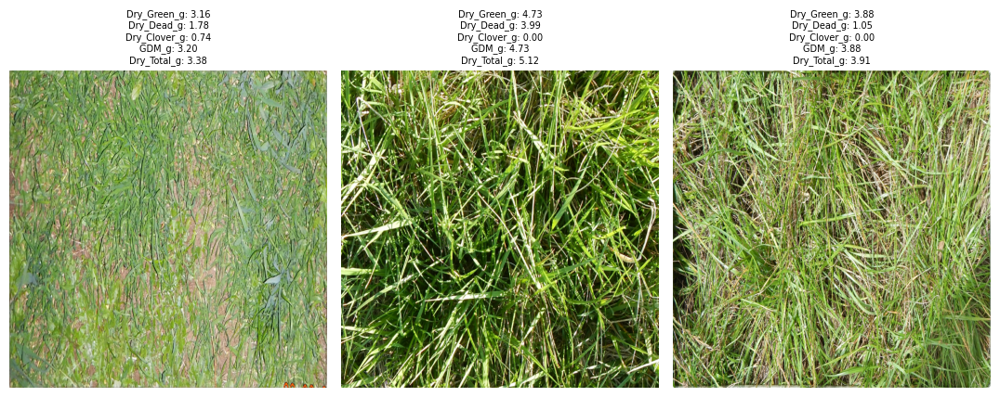

In [9]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(18, 5))

for images, targets in train_ds.take(1):
    for i in range(3):  # show 5 images
        ax = plt.subplot(1, 5, i + 1)
        
        # Convert ONLY RGB channels for display
        rgb = images[i][..., :3].numpy()
        plt.imshow(rgb)
        
        # Targets (currently normalized via log1p)
        t = targets[i].numpy()
        
        # OPTIONAL: convert back to original biomass values
        # Uncomment if you want actual grams:
        # t = np.expm1(t)
        
        # Create title string
        title_str = "\n".join([f"{n}: {v:.2f}" for n, v in zip(target_cols, t)])
        
        plt.title(title_str, fontsize=7)
        plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
from tensorflow.keras.applications import ConvNeXtTiny
from tensorflow.keras import layers, Model, Input

def build_model(input_shape=(768, 768, 11), n_outputs=5):
    inp = Input(shape=input_shape)


    x = layers.Conv2D(96, 4, strides=4, padding="same",name="custom_stem_conv")(inp)

    base = ConvNeXtTiny(include_top=False, weights="imagenet")

    backbone_input = x

    for layer in base.layers[3:]:
        backbone_input = layer(backbone_input)

    x = backbone_input

    x = layers.GlobalAveragePooling2D()(x)


    x = layers.Dense(1024, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(512, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.1)(x)

    out = layers.Dense(n_outputs, activation="linear")(x)

    model = Model(inp, out, name="ConvNeXt_11ch_5out")

    return model


model = build_model()
model.summary()


Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 28,062,629 (107.05 MB)

 Trainable params: 28,062,629 (107.05 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
# Freeze all ConvNeXt layers (only train custom stem + head)
for layer in model.layers:
    if "convnext" in layer.name:   # all ConvNeXt layers
        layer.trainable = False

model.summary()

Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 28,062,629 (107.05 MB)

 Trainable params: 248,933 (972.39 KB)

 Non-trainable params: 27,813,696 (106.10 MB)

In [12]:
import tensorflow as tf
import tensorflow.keras.backend as K

# Weighted R2 metric
def weighted_r2(y_true, y_pred):
    weights = tf.constant([0.1, 0.1, 0.1, 0.2, 0.5], dtype=tf.float32)
    mean_y_true = K.mean(y_true, axis=0)
    tss = K.sum(K.square(y_true - mean_y_true), axis=0)
    rss = K.sum(K.square(y_true - y_pred), axis=0)
    r2_scores = 1 - rss / (tss + K.epsilon())
    return K.sum(r2_scores * weights)

# Per-target MAEs
def mae_0(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,0] - y_pred[:,0]))
def mae_1(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,1] - y_pred[:,1]))
def mae_2(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,2] - y_pred[:,2]))
def mae_3(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,3] - y_pred[:,3]))
def mae_4(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,4] - y_pred[:,4]))

In [13]:
optimizer_warmup = tf.keras.optimizers.Adam(
    learning_rate=3e-5,
    clipnorm=1.0
)

model.compile(
    optimizer=optimizer_warmup,
    loss=tf.keras.losses.Huber(delta=1.0),
    metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4, weighted_r2]
)


In [14]:
history_warmup = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=3,
    verbose=1
)


Epoch 1/3


I0000 00:00:1764679164.425736   17550 service.cc:152] XLA service 0x7cef3c003290 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764679164.425767   17550 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-12-02 18:09:24.619585: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1764679165.552241   17550 cuda_dnn.cc:529] Loaded cuDNN version 91002
2025-12-02 18:09:27.281323: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot', 840 bytes spill stores, 840 bytes spill loads

2025-12-02 18:09:27.613920: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_d

  1/101 ━━━━━━━━━━━━━━━━━━━━ 54:20 33s/step - loss: 2.1602 - mae: 2.6574 - mae_0: 3.2024 - mae_1: 1.4351 - mae_2: 1.7665 - mae_3: 4.0374 - mae_4: 2.8457 - weighted_r2: -22.1303

I0000 00:00:1764679184.118208   17550 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


101/101 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 1.0944 - mae: 1.5313 - mae_0: 1.7472 - mae_1: 1.3060 - mae_2: 1.2250 - mae_3: 1.7575 - mae_4: 1.6209 - weighted_r2: -126998.4766 - val_loss: 0.4866 - val_mae: 0.8831 - val_mae_0: 1.0238 - val_mae_1: 0.9096 - val_mae_2: 1.2475 - val_mae_3: 0.7191 - val_mae_4: 0.5156 - val_weighted_r2: -2.1762
Epoch 2/3
101/101 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - loss: 0.6455 - mae: 1.0455 - mae_0: 1.1385 - mae_1: 1.0404 - mae_2: 1.2507 - mae_3: 0.9187 - mae_4: 0.8791 - weighted_r2: -232167.4219 - val_loss: 0.4788 - val_mae: 0.8717 - val_mae_0: 1.0042 - val_mae_1: 0.8817 - val_mae_2: 1.2462 - val_mae_3: 0.7168 - val_mae_4: 0.5094 - val_weighted_r2: -2.0671
Epoch 3/3
101/101 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - loss: 0.6583 - mae: 1.0599 - mae_0: 1.1715 - mae_1: 1.0356 - mae_2: 1.2787 - mae_3: 0.9966 - mae_4: 0.8169 - weighted_r2: -236858.3750 - val_loss: 0.4653 - val_mae: 0.8589 - val_mae_0: 1.0150 - val_mae_1: 0.8882 - val_mae_2: 1.2159 - val_mae_3:

In [15]:
# Unfreeze everything
for layer in model.layers:
    layer.trainable = True

model.summary()

Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 28,560,497 (108.95 MB)

 Trainable params: 28,062,629 (107.05 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 497,868 (1.90 MB)

In [16]:
optimizer_full = tf.keras.optimizers.Adam(
    learning_rate=5e-6,
    clipnorm=1.0
)

model.compile(
    optimizer=optimizer_full,
    loss=tf.keras.losses.Huber(delta=1.0),
    metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4, weighted_r2]
)


In [17]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'feature_best_model.keras',
    monitor='val_weighted_r2',
    mode='max',
    save_best_only=True,
    verbose=1
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_weighted_r2',
    mode='max',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_weighted_r2',
    mode='max',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)


In [18]:
history_full = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=1,
    callbacks=[checkpoint, reduce_lr],
    # callbacks=[checkpoint, reduce_lr, early_stopping],
    verbose=1
)


2025-12-02 18:11:37.206376: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_143', 4 bytes spill stores, 4 bytes spill loads

2025-12-02 18:11:38.996231: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-02 18:11:39.082094: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-02 18:11:39.287997: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-02 18:11:39.372285: E external/local_xla/xla/strea

101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - loss: 0.6338 - mae: 1.0297 - mae_0: 1.1239 - mae_1: 1.0047 - mae_2: 1.1861 - mae_3: 0.9953 - mae_4: 0.8386 - weighted_r2: -365837.6875
Epoch 1: val_weighted_r2 improved from None to -2.66498, saving model to feature_best_model.keras
101/101 ━━━━━━━━━━━━━━━━━━━━ 90s 436ms/step - loss: 0.6089 - mae: 1.0035 - mae_0: 1.0461 - mae_1: 1.0301 - mae_2: 1.1851 - mae_3: 0.9182 - mae_4: 0.8380 - weighted_r2: -439117.0000 - val_loss: 0.4792 - val_mae: 0.8837 - val_mae_0: 1.0053 - val_mae_1: 0.8493 - val_mae_2: 1.2217 - val_mae_3: 0.7837 - val_mae_4: 0.5586 - val_weighted_r2: -2.6650 - learning_rate: 5.0000e-06


In [19]:
history_full = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[checkpoint, reduce_lr],
    # callbacks=[checkpoint, reduce_lr, early_stopping],
    verbose=1
)


Epoch 1/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - loss: 0.5772 - mae: 0.9713 - mae_0: 0.9648 - mae_1: 0.9333 - mae_2: 1.2316 - mae_3: 0.9367 - mae_4: 0.7899 - weighted_r2: -328319.2188
Epoch 1: val_weighted_r2 improved from -2.66498 to -1.84362, saving model to feature_best_model.keras
101/101 ━━━━━━━━━━━━━━━━━━━━ 47s 383ms/step - loss: 0.5807 - mae: 0.9742 - mae_0: 1.0251 - mae_1: 0.9167 - mae_2: 1.1515 - mae_3: 0.9476 - mae_4: 0.8303 - weighted_r2: -301916.9375 - val_loss: 0.4575 - val_mae: 0.8499 - val_mae_0: 0.9801 - val_mae_1: 0.8797 - val_mae_2: 1.2158 - val_mae_3: 0.6650 - val_mae_4: 0.5091 - val_weighted_r2: -1.8436 - learning_rate: 5.0000e-06
Epoch 2/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step - loss: 0.6063 - mae: 1.0109 - mae_0: 1.0888 - mae_1: 1.0074 - mae_2: 1.1647 - mae_3: 0.9073 - mae_4: 0.8865 - weighted_r2: -226505.2500
Epoch 2: val_weighted_r2 improved from -1.84362 to -1.82535, saving model to feature_best_model.keras
101/101 ━━━━━━━━━━━━━━━━━━━━ 47s 383ms/st

2025-12-02 18:18:57.254548: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] ShuffleDatasetV3:2: Filling up shuffle buffer (this may take a while): 271 of 303
2025-12-02 18:18:58.170690: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:482] Shuffle buffer filled.


101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - loss: 0.5217 - mae: 0.9128 - mae_0: 0.9490 - mae_1: 0.9289 - mae_2: 1.1354 - mae_3: 0.7982 - mae_4: 0.7523 - weighted_r2: -152424.3438
Epoch 9: val_weighted_r2 improved from -1.53125 to -1.41538, saving model to feature_best_model.keras
101/101 ━━━━━━━━━━━━━━━━━━━━ 52s 407ms/step - loss: 0.5202 - mae: 0.9087 - mae_0: 0.9547 - mae_1: 0.9045 - mae_2: 1.1315 - mae_3: 0.8006 - mae_4: 0.7522 - weighted_r2: -165711.4844 - val_loss: 0.4407 - val_mae: 0.8241 - val_mae_0: 0.9321 - val_mae_1: 0.8915 - val_mae_2: 1.2387 - val_mae_3: 0.5880 - val_mae_4: 0.4703 - val_weighted_r2: -1.4154 - learning_rate: 5.0000e-06
Epoch 10/50
101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - loss: 0.5281 - mae: 0.9096 - mae_0: 0.9058 - mae_1: 0.9686 - mae_2: 1.1572 - mae_3: 0.7334 - mae_4: 0.7830 - weighted_r2: -222456.0781
Epoch 10: val_weighted_r2 did not improve from -1.41538
101/101 ━━━━━━━━━━━━━━━━━━━━ 46s 378ms/step - loss: 0.5309 - mae: 0.9135 - mae_0: 0.9474 - mae_1:

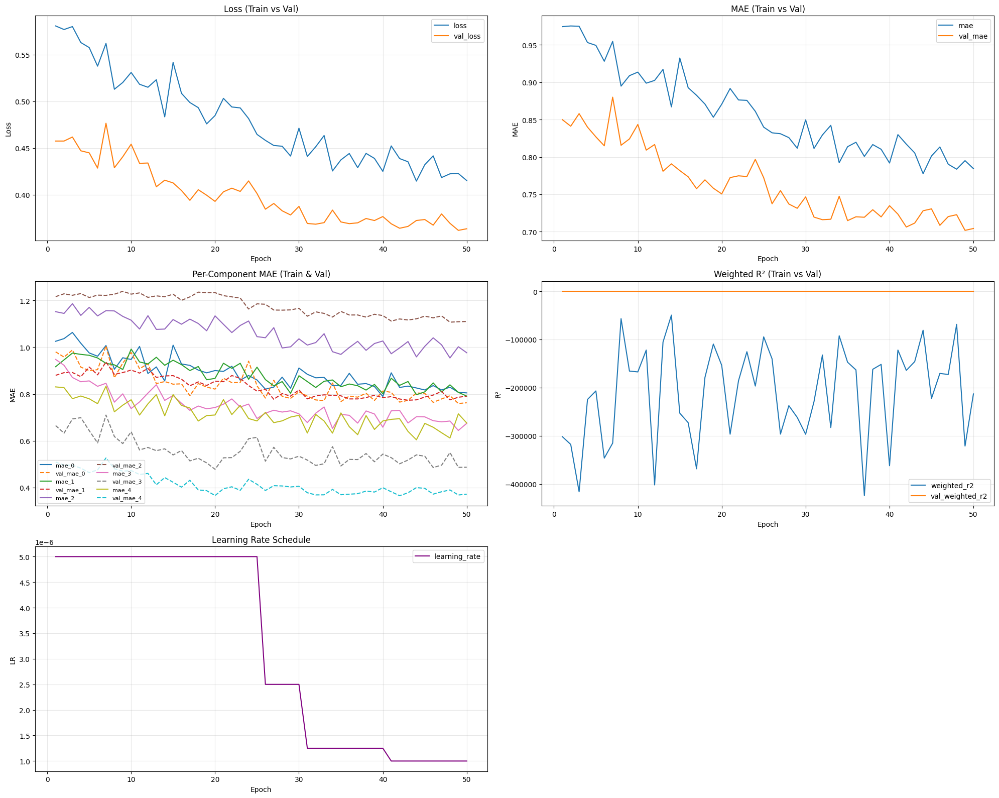

In [20]:
import matplotlib.pyplot as plt

def plot_pretty(history):
    h = history.history
    epochs = range(1, len(h['loss']) + 1)

    plt.figure(figsize=(20, 16))

    # -------------------------------
    # 1. LOSS (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 1)
    plt.plot(epochs, h['loss'], label='loss')
    plt.plot(epochs, h['val_loss'], label='val_loss')
    plt.title("Loss (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 2. MAE (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 2)
    plt.plot(epochs, h['mae'], label='mae')
    plt.plot(epochs, h['val_mae'], label='val_mae')
    plt.title("MAE (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("MAE")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 3. Per-Component MAE
    # -------------------------------
    plt.subplot(3, 2, 3)
    for i in range(5):
        plt.plot(epochs, h[f'mae_{i}'], label=f'mae_{i}')
        plt.plot(epochs, h[f'val_mae_{i}'], '--', label=f'val_mae_{i}')
    plt.title("Per-Component MAE (Train & Val)")
    plt.xlabel("Epoch")
    plt.ylabel("MAE")
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=8, ncol=2)

    # -------------------------------
    # 4. Weighted R2 (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 4)
    plt.plot(epochs, h['weighted_r2'], label='weighted_r2')
    plt.plot(epochs, h['val_weighted_r2'], label='val_weighted_r2')
    plt.title("Weighted R² (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("R²")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 5. Learning Rate Schedule
    # -------------------------------
    if 'learning_rate' in h:
        plt.subplot(3, 2, 5)
        plt.plot(epochs, h['learning_rate'], label='learning_rate', color='purple')
        plt.title("Learning Rate Schedule")
        plt.xlabel("Epoch")
        plt.ylabel("LR")
        plt.grid(True, alpha=0.3)
        plt.legend()

    plt.tight_layout()
    plt.show()
plot_pretty(history_full)

In [21]:
from tensorflow.keras.models import save_model
save_model(model, "model9_v2.keras", save_format="keras")

In [22]:
# from tensorflow.keras.models import load_model

# model = load_model(
#     "/home/vector/project/CSIRO---Image2Biomass-Prediction/model9.keras",
#     custom_objects={
#         "weighted_r2": weighted_r2,
#         "mae_0": mae_0,
#         "mae_1": mae_1,
#         "mae_2": mae_2,
#         "mae_3": mae_3,
#         "mae_4": mae_4,
#     }
# )

# print("Model loaded successfully!")


2025-12-02 18:51:54.019940: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


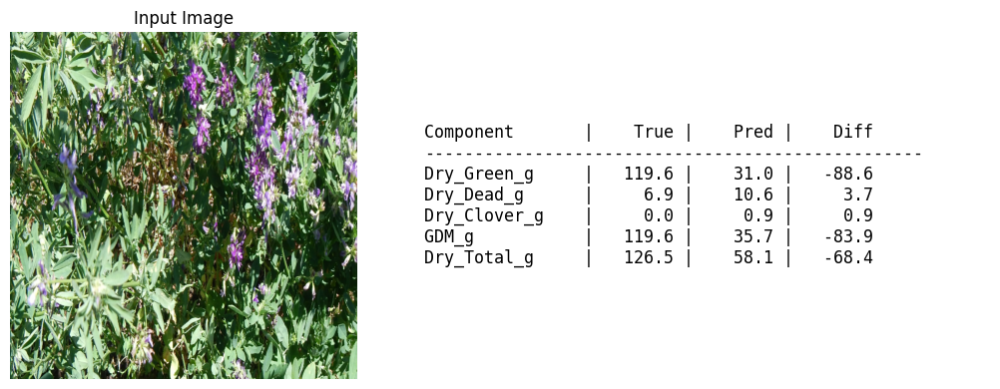

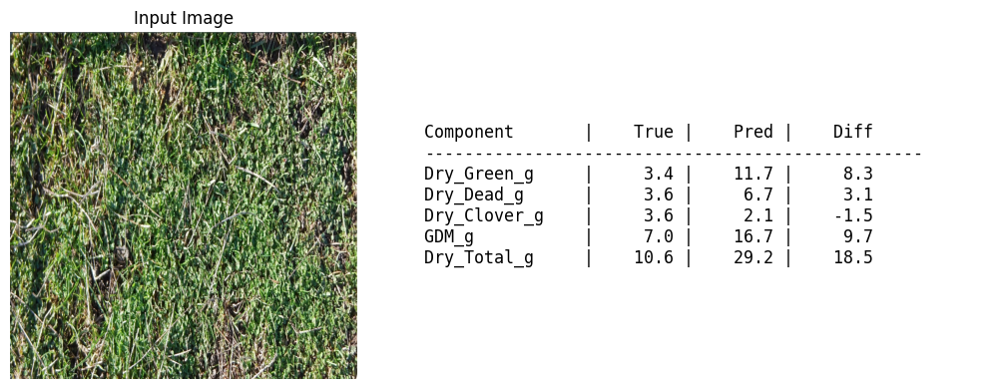

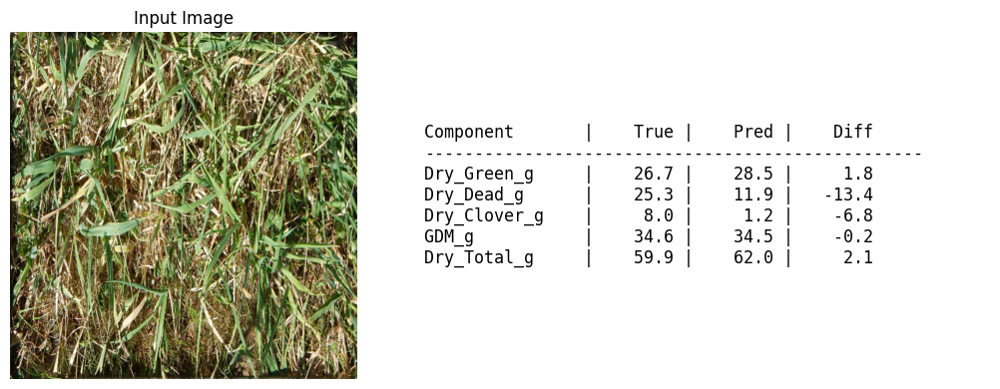

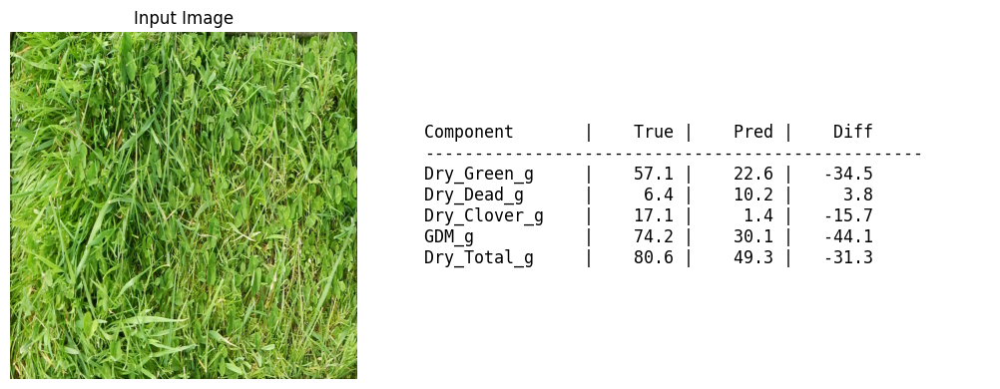

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def denormalize(y):
    return tf.math.expm1(y)

def evaluate_and_visualize_rgb(model, val_ds, num_samples=4):
    all_images = []
    all_targets = []
    all_preds = []

    print("Collecting predictions...")
    for images, targets in val_ds:
        preds = model.predict(images, verbose=0)

        # Convert tensors to numpy
        images = images.numpy()
        targets = targets.numpy()
        preds = preds

        # Keep RGB only
        images = images[..., :3]
        images = np.clip(images, 0, 1)

        all_images.append(images)
        all_targets.append(targets)
        all_preds.append(preds)

    # Combine
    all_images = np.concatenate(all_images, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    all_preds = np.concatenate(all_preds, axis=0)

    target_names = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']

    idxs = np.random.choice(len(all_images), num_samples, replace=False)

    for idx in idxs:
        img = all_images[idx]

        # ---- apply denormalization ----
        true = denormalize(all_targets[idx]).numpy()
        pred = denormalize(all_preds[idx]).numpy()

        plt.figure(figsize=(12,4))

        # Image
        plt.subplot(1,2,1)
        plt.imshow(img)
        plt.axis("off")
        plt.title("Input Image")

        # Table
        plt.subplot(1,2,2)
        plt.axis("off")

        text = f"{'Component':<15} | {'True':>7} | {'Pred':>7} | {'Diff':>7}\n"
        text += "-"*50 + "\n"

        for i, name in enumerate(target_names):
            diff = pred[i] - true[i]
            text += f"{name:<15} | {true[i]:7.1f} | {pred[i]:7.1f} | {diff:7.1f}\n"

        plt.text(0, 0.5, text, fontsize=12, family="monospace", va="center")
        plt.tight_layout()
        plt.show()

# run
evaluate_and_visualize_rgb(model, val_ds, num_samples=4)


In [24]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os

print("Loading test data...")
test_df = pd.read_csv(PATH + "/test.csv")

# Get unique images to predict on
unique_images = test_df['image_path'].unique()
print(f"Found {len(unique_images)} unique test images.")

test_ds = tf.data.Dataset.from_tensor_slices(unique_images)
test_ds = test_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


print("Predicting...")
# Predict
predictions = model.predict(test_ds, verbose=1)


target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']

# Create a lookup dictionary: image_path -> {target_name: value}
pred_dict = {}
for img_path, pred_row in zip(unique_images, denormalize(predictions).numpy()):
    pred_dict[img_path] = {col: val for col, val in zip(target_cols, pred_row)}


print("Formatting submission...")
# Create submission rows
submission_rows = []
for index, row in test_df.iterrows():
    img_path = row['image_path']
    target_name = row['target_name']
    sample_id = row['sample_id']
    
    # Get prediction
    if img_path in pred_dict:
        pred_value = pred_dict[img_path][target_name]
    else:
        # Fallback if something went wrong (shouldn't happen)
        pred_value = 0.0
    
    # Ensure non-negative (biomass can't be negative)
    pred_value = max(0.0, pred_value)
    
    submission_rows.append({'sample_id': sample_id, 'target': pred_value})
    
submission_df = pd.DataFrame(submission_rows)

# Save to CSV
output_file = "submission.csv"
submission_df.to_csv(output_file, index=False)
print(f"Saved submission to {output_file}")

# Print the content for user to copy if needed
print("\n" + "="*20 + " SUBMISSION CSV CONTENT " + "="*20)
print(submission_df.to_csv(index=False))
print("="*64)



Loading test data...
Found 1 unique test images.
Predicting...


2025-12-02 18:51:57.255888: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-02 18:51:57.387054: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-02 18:51:57.513680: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-02 18:51:57.629212: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-02 18:51:57.746291: E external/local_xla/xla/stream_

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Formatting submission...
Saved submission to submission.csv

==================== SUBMISSION CSV CONTENT ====================
sample_id,target
ID1001187975__Dry_Clover_g,1.4024987
ID1001187975__Dry_Dead_g,9.304479
ID1001187975__Dry_Green_g,19.541933
ID1001187975__Dry_Total_g,41.831852
ID1001187975__GDM_g,24.900276

